<a href="https://colab.research.google.com/github/kartikgill/The-GAN-Book/blob/main/Skill-08/Horses2Zebras-CycleGAN/Cycle-GAN-Horses-Zebras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Useful Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [ ]:
import tensorflow
print (tensorflow.__version__)

2.4.0


# Download and Unzip Data

In [ ]:
!wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip

--2021-01-06 05:37:28--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116867962 (111M) [application/zip]
Saving to: ‘horse2zebra.zip’

horse2zebra.zip     100%[===================>] 111.45M  6.64MB/s    in 17s     

2021-01-06 05:37:45 (6.70 MB/s) - ‘horse2zebra.zip’ saved [116867962/116867962]



In [ ]:
!unzip horse2zebra.zip

In [ ]:
!ls horse2zebra

testA  testB  trainA  trainB


In [ ]:
import glob
path = ""
horses_train = glob.glob(path + 'horse2zebra/trainA/*.jpg')
zebras_train = glob.glob(path + 'horse2zebra/trainB/*.jpg')
horses_test = glob.glob(path + 'horse2zebra/testA/*.jpg')
zebras_test = glob.glob(path + 'horse2zebra/testB/*.jpg')

In [ ]:
len(horses_train), len(zebras_train), len(horses_test), len(zebras_test)

(1067, 1334, 120, 140)

In [ ]:
import cv2
for file in horses_train[:10]:
    img = cv2.imread(file)
    print (img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


# Display few Samples

Horses


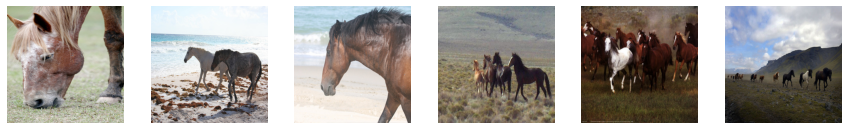

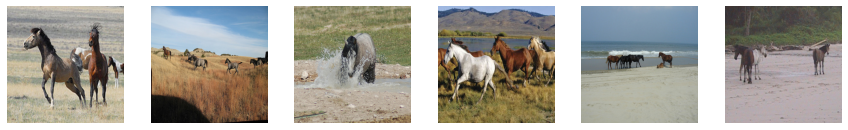

--------------------------------------------------------------------------------
Zebras


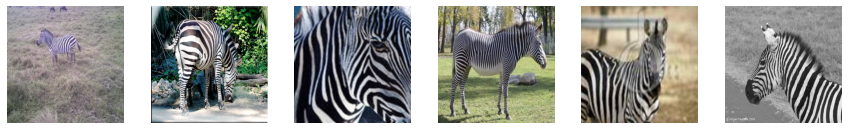

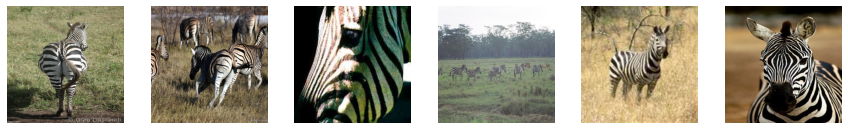

In [ ]:
print ("Horses")
for k in range(2):
    plt.figure(figsize=(15, 15))
    for j in range(6):
        file = np.random.choice(horses_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(660 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("Zebras")
for k in range(2):
    plt.figure(figsize=(15, 15))
    for j in range(6):
        file = np.random.choice(zebras_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(660 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Define Generator Model (Res-Net Like)

In [ ]:
#Following function is taken from: https://keras.io/examples/generative/cyclegan/

class ReflectionPadding2D(tensorflow.keras.layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tensorflow.pad(input_tensor, padding_tensor, mode="REFLECT")

In [ ]:
import tensorflow_addons as tfa

In [ ]:
# Weights initializer for the layers.
kernel_init = tensorflow.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = tensorflow.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [ ]:
def custom_resnet_block(input_data, filters):
    x = ReflectionPadding2D()(input_data)
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(3,3), padding='valid', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = ReflectionPadding2D()(x)
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(3,3), padding='valid', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)

    x = tensorflow.keras.layers.Add()([x, input_data])
    return x

In [ ]:
def make_generator():
    source_image = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    x = ReflectionPadding2D(padding=(3, 3))(source_image)
    x = tensorflow.keras.layers.Conv2D(64, kernel_size=(7,7), kernel_initializer=kernel_init, use_bias=False)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = tensorflow.keras.layers.Conv2D(128, kernel_size=(3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = tensorflow.keras.layers.Conv2D(256, kernel_size=(3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)

    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)

    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)
    x = custom_resnet_block(x, 256)

    x = tensorflow.keras.layers.Conv2DTranspose(128, kernel_size=(3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = tensorflow.keras.layers.Conv2DTranspose(64, kernel_size=(3,3), strides=(2,2), padding='same', kernel_initializer=kernel_init)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Activation('relu')(x)

    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = tensorflow.keras.layers.Conv2D(3, kernel_size=(7,7), padding='valid')(x)
    x = tfa.layers.InstanceNormalization()(x)

    translated_image = tensorflow.keras.layers.Activation('tanh')(x)

    return source_image, translated_image

source_image, translated_image = make_generator()
generator_network_AB = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

source_image, translated_image = make_generator()
generator_network_BA = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

print (generator_network_AB.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
reflection_padding2d (Reflectio (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 9408        reflection_padding2d[0][0]       
__________________________________________________________________________________________________
instance_normalization (Instanc (None, 256, 256, 64) 128         conv2d[0][0]                     
______________________________________________________________________________________________

# Define Discriminator Network

In [ ]:
def my_conv_layer(input_layer, filters, strides, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=strides, padding='same', kernel_initializer=kernel_init)(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        x = tfa.layers.InstanceNormalization()(x)
    return x

In [ ]:
 def make_discriminator():
    target_image_input = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    x = my_conv_layer(target_image_input, 64, (2,2), bn=False)
    x = my_conv_layer(x, 128, (2,2))
    x = my_conv_layer(x, 256, (2,2))
    x = my_conv_layer(x, 512, (1,1))

    patch_features = tensorflow.keras.layers.Conv2D(1, kernel_size=(4,4), padding='same')(x)
    return target_image_input, patch_features


target_image_input, patch_features = make_discriminator()
discriminator_network_A = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

target_image_input, patch_features = make_discriminator()
discriminator_network_B = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

print (discriminator_network_A.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 128, 128, 64)      3136      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 64, 64, 128)       131200    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
instance_normalization_48 (I (None, 64, 64, 128)       256       
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 32, 32, 256)       5245

In [ ]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network_A.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])
discriminator_network_B.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])

# Define Cycle-GAN

In [ ]:
source_image_A = tensorflow.keras.layers.Input(shape=(256, 256, 3))
source_image_B = tensorflow.keras.layers.Input(shape=(256, 256, 3))

# Domain Transfer
fake_B = generator_network_AB(source_image_A)
fake_A = generator_network_BA(source_image_B)

# Restoring original Domain
get_back_A = generator_network_BA(fake_B)
get_back_B = generator_network_AB(fake_A)

# Get back Identical/Same Image
get_same_A = generator_network_BA(source_image_A)
get_same_B = generator_network_AB(source_image_B)
  
discriminator_network_A.trainable=False
discriminator_network_B.trainable=False

# Tell Real vs Fake, for a given domain
verify_A = discriminator_network_A(fake_A)
verify_B = discriminator_network_B(fake_B)

cycle_gan = tensorflow.keras.models.Model(inputs = [source_image_A, source_image_B], \
                              outputs = [verify_A, verify_B, get_back_A, get_back_B, get_same_A, get_same_B])
cycle_gan.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Functional)            (None, 256, 256, 3)  11388617    input_6[0][0]                    
                                                                 model[0][0]                      
                                                                 input_5[0][0]                    
____________________________________________________________________________________________

# Compiling Model

In [ ]:
cycle_gan.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'], loss_weights=[1, 1, 10, 10, 5, 5],\
                                          optimizer=adam_optimizer)

# Define Data Generators

In [ ]:
def horses_to_zebras(horses, generator_network):
    generated_samples = generator_network.predict_on_batch(horses)
    return generated_samples

def zebras_to_horses(zebras, generator_network):
    generated_samples = generator_network.predict_on_batch(zebras)
    return generated_samples

def get_horse_samples(batch_size):
    random_files = np.random.choice(horses_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    horse_images = np.array(images)
    return horse_images

def get_zebra_samples(batch_size):
    random_files = np.random.choice(zebras_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    zebra_images = np.array(images)
    return zebra_images

def show_generator_results_horses_to_zebras(generator_network_AB, generator_network_BA):
    images = []
    for j in range(5):
        file = np.random.choice(horses_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Horse Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(550 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Horse -> Zebra) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = horses_to_zebras(np.array([img]), generator_network_AB)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse ( Fake Zebras -> Fake Horses)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = zebras_to_horses(np.array([img]), generator_network_BA)[0]
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

def show_generator_results_zebras_to_horses(generator_network_AB, generator_network_BA):
    images = []
    for j in range(5):
        file = np.random.choice(zebras_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Zebra Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(550 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Zebra -> Horse) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = zebras_to_horses(np.array([img]), generator_network_BA)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse (Fake Horse -> Fake Zebra)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = horses_to_zebras(np.array([img]), generator_network_AB)[0]
        output = (output+1.0)/2.0
        plt.subplot(550 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Training Cycle-GAN

In [ ]:
len(horses_train), len(zebras_train)

(1067, 1334)

Input Horse Images


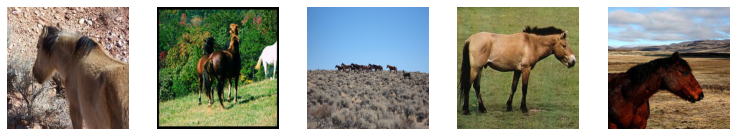

Translated (Horse -> Zebra) Images


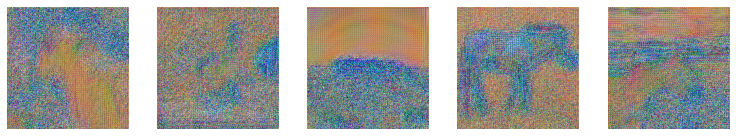

Translated reverse ( Fake Zebras -> Fake Horses)


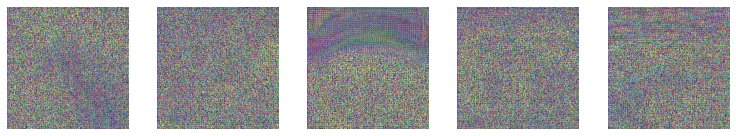

----------------------------------------------------------------------------------------------------
Input Zebra Images


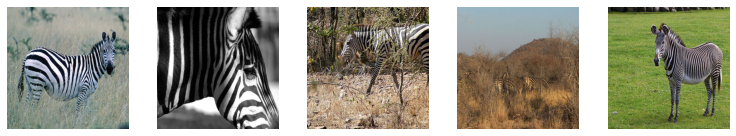

Translated (Zebra -> Horse) Images


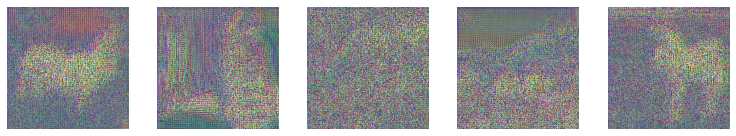

Translated reverse (Fake Horse -> Fake Zebra)


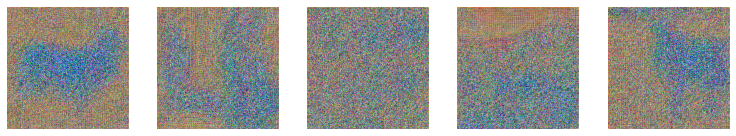

Epoch:0, Step:0, DA-Loss:3.535, DA-Acc:49.951, DB-Loss:2.649, DB-Acc:47.412, G-Loss:36.135
Epoch:0, Step:100, DA-Loss:0.354, DA-Acc:40.967, DB-Loss:0.382, DB-Acc:48.193, G-Loss:7.942
Epoch:0, Step:200, DA-Loss:0.210, DA-Acc:74.365, DB-Loss:0.254, DB-Acc:60.791, G-Loss:12.729
Epoch:0, Step:300, DA-Loss:0.269, DA-Acc:65.039, DB-Loss:0.274, DB-Acc:61.084, G-Loss:9.904
Epoch:0, Step:400, DA-Loss:0.296, DA-Acc:56.006, DB-Loss:0.266, DB-Acc:51.953, G-Loss:7.609
Epoch:0, Step:500, DA-Loss:0.252, DA-Acc:49.854, DB-Loss:0.311, DB-Acc:54.297, G-Loss:10.891
Epoch:0, Step:600, DA-Loss:0.279, DA-Acc:46.924, DB-Loss:0.331, DB-Acc:45.605, G-Loss:5.328
Epoch:0, Step:700, DA-Loss:0.280, DA-Acc:53.125, DB-Loss:0.346, DB-Acc:41.455, G-Loss:10.363
Epoch:0, Step:800, DA-Loss:0.312, DA-Acc:51.758, DB-Loss:0.244, DB-Acc:60.156, G-Loss:8.232
Epoch:0, Step:900, DA-Loss:0.330, DA-Acc:53.809, DB-Loss:0.282, DB-Acc:53.320, G-Loss:8.059
Epoch:0, Step:1000, DA-Loss:0.485, DA-Acc:37.891, DB-Loss:0.352, DB-Acc:58.838

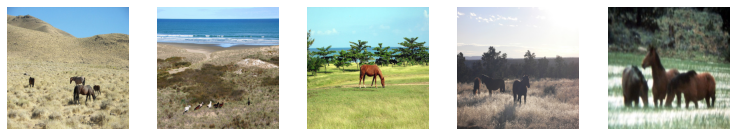

Translated (Horse -> Zebra) Images


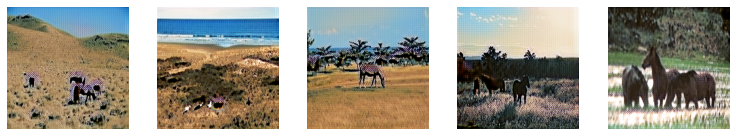

Translated reverse ( Fake Zebras -> Fake Horses)


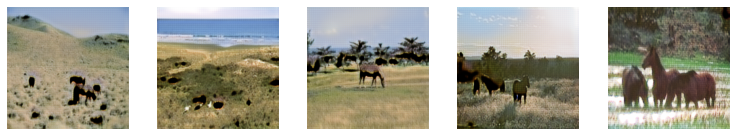

----------------------------------------------------------------------------------------------------
Input Zebra Images


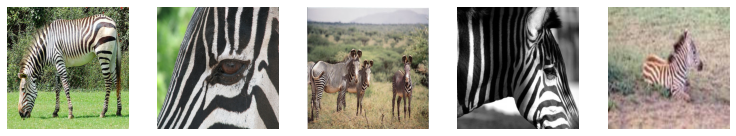

Translated (Zebra -> Horse) Images


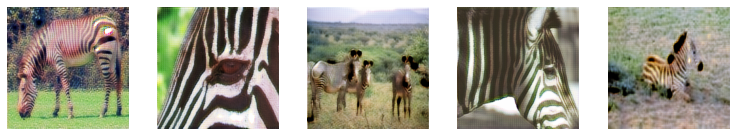

Translated reverse (Fake Horse -> Fake Zebra)


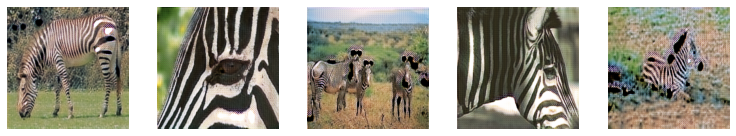

Epoch:5, Step:0, DA-Loss:0.282, DA-Acc:52.734, DB-Loss:0.384, DB-Acc:49.902, G-Loss:8.231
Epoch:5, Step:100, DA-Loss:0.145, DA-Acc:78.760, DB-Loss:0.125, DB-Acc:86.670, G-Loss:6.193
Epoch:5, Step:200, DA-Loss:0.300, DA-Acc:68.701, DB-Loss:0.293, DB-Acc:70.752, G-Loss:6.219
Epoch:5, Step:300, DA-Loss:0.131, DA-Acc:93.066, DB-Loss:0.133, DB-Acc:88.281, G-Loss:5.975
Epoch:5, Step:400, DA-Loss:0.151, DA-Acc:87.695, DB-Loss:0.127, DB-Acc:89.062, G-Loss:4.895
Epoch:5, Step:500, DA-Loss:0.099, DA-Acc:92.041, DB-Loss:0.152, DB-Acc:85.254, G-Loss:6.470
Epoch:5, Step:600, DA-Loss:0.087, DA-Acc:93.457, DB-Loss:0.118, DB-Acc:90.479, G-Loss:6.934
Epoch:5, Step:700, DA-Loss:0.168, DA-Acc:82.910, DB-Loss:0.232, DB-Acc:60.986, G-Loss:5.623
Epoch:5, Step:800, DA-Loss:0.667, DA-Acc:24.756, DB-Loss:0.289, DB-Acc:57.764, G-Loss:5.385
Epoch:5, Step:900, DA-Loss:0.326, DA-Acc:83.203, DB-Loss:0.418, DB-Acc:51.367, G-Loss:5.727
Epoch:5, Step:1000, DA-Loss:0.154, DA-Acc:92.725, DB-Loss:0.162, DB-Acc:86.768, G-

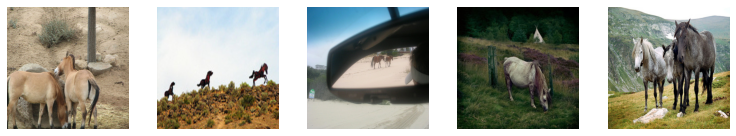

Translated (Horse -> Zebra) Images


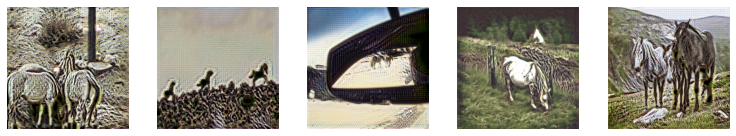

Translated reverse ( Fake Zebras -> Fake Horses)


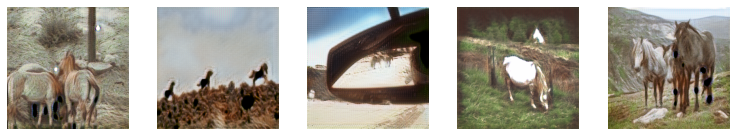

----------------------------------------------------------------------------------------------------
Input Zebra Images


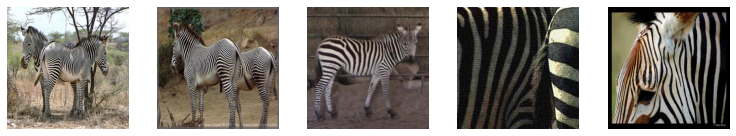

Translated (Zebra -> Horse) Images


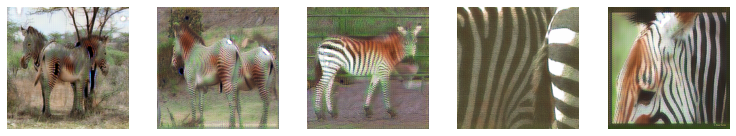

Translated reverse (Fake Horse -> Fake Zebra)


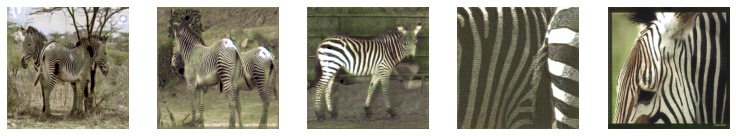

Epoch:10, Step:0, DA-Loss:0.091, DA-Acc:97.363, DB-Loss:0.137, DB-Acc:86.279, G-Loss:6.276
Epoch:10, Step:100, DA-Loss:0.071, DA-Acc:94.824, DB-Loss:0.474, DB-Acc:17.236, G-Loss:5.764
Epoch:10, Step:200, DA-Loss:0.299, DA-Acc:49.902, DB-Loss:0.022, DB-Acc:99.951, G-Loss:7.054
Epoch:10, Step:300, DA-Loss:0.086, DA-Acc:91.699, DB-Loss:0.309, DB-Acc:54.346, G-Loss:6.747
Epoch:10, Step:400, DA-Loss:0.147, DA-Acc:84.326, DB-Loss:0.061, DB-Acc:96.191, G-Loss:7.108
Epoch:10, Step:500, DA-Loss:0.136, DA-Acc:93.213, DB-Loss:0.282, DB-Acc:53.662, G-Loss:5.937
Epoch:10, Step:600, DA-Loss:0.061, DA-Acc:97.266, DB-Loss:0.043, DB-Acc:99.219, G-Loss:8.005
Epoch:10, Step:700, DA-Loss:0.200, DA-Acc:72.119, DB-Loss:0.058, DB-Acc:96.826, G-Loss:6.562
Epoch:10, Step:800, DA-Loss:0.298, DA-Acc:53.125, DB-Loss:0.041, DB-Acc:99.805, G-Loss:5.339
Epoch:10, Step:900, DA-Loss:0.152, DA-Acc:73.096, DB-Loss:0.180, DB-Acc:69.238, G-Loss:4.802
Epoch:10, Step:1000, DA-Loss:0.116, DA-Acc:90.332, DB-Loss:0.279, DB-Acc

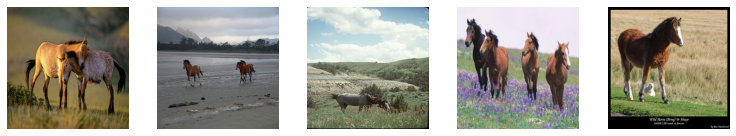

Translated (Horse -> Zebra) Images


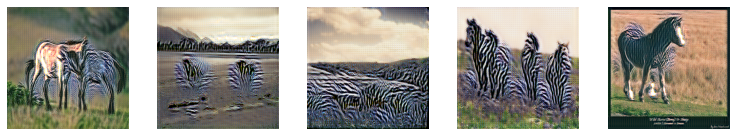

Translated reverse ( Fake Zebras -> Fake Horses)


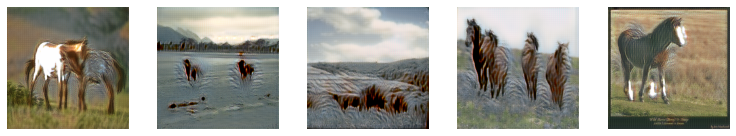

----------------------------------------------------------------------------------------------------
Input Zebra Images


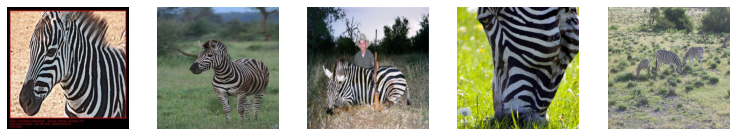

Translated (Zebra -> Horse) Images


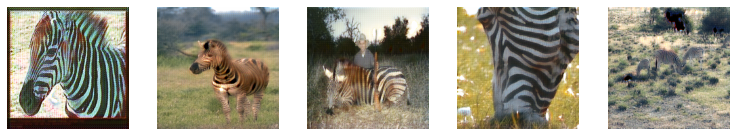

Translated reverse (Fake Horse -> Fake Zebra)


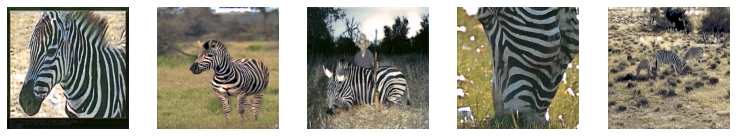

Epoch:15, Step:0, DA-Loss:0.101, DA-Acc:90.283, DB-Loss:0.080, DB-Acc:95.752, G-Loss:7.180
Epoch:15, Step:100, DA-Loss:0.065, DA-Acc:95.605, DB-Loss:0.062, DB-Acc:96.973, G-Loss:10.200
Epoch:15, Step:200, DA-Loss:0.179, DA-Acc:60.986, DB-Loss:0.049, DB-Acc:99.561, G-Loss:5.795
Epoch:15, Step:300, DA-Loss:0.040, DA-Acc:99.854, DB-Loss:0.110, DB-Acc:92.871, G-Loss:4.710
Epoch:15, Step:400, DA-Loss:0.270, DA-Acc:52.100, DB-Loss:0.330, DB-Acc:50.879, G-Loss:5.627
Epoch:15, Step:500, DA-Loss:0.043, DA-Acc:98.730, DB-Loss:0.035, DB-Acc:99.268, G-Loss:7.881
Epoch:15, Step:600, DA-Loss:0.220, DA-Acc:76.562, DB-Loss:0.318, DB-Acc:50.488, G-Loss:5.259
Epoch:15, Step:700, DA-Loss:0.365, DA-Acc:51.465, DB-Loss:0.096, DB-Acc:89.209, G-Loss:6.022
Epoch:15, Step:800, DA-Loss:0.053, DA-Acc:98.828, DB-Loss:0.087, DB-Acc:95.947, G-Loss:7.708
Epoch:15, Step:900, DA-Loss:0.112, DA-Acc:82.129, DB-Loss:0.334, DB-Acc:24.316, G-Loss:5.749
Epoch:15, Step:1000, DA-Loss:0.027, DA-Acc:97.754, DB-Loss:0.049, DB-Ac

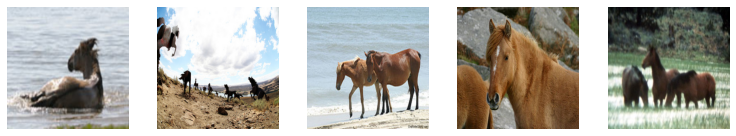

Translated (Horse -> Zebra) Images


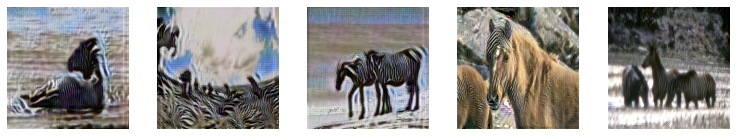

Translated reverse ( Fake Zebras -> Fake Horses)


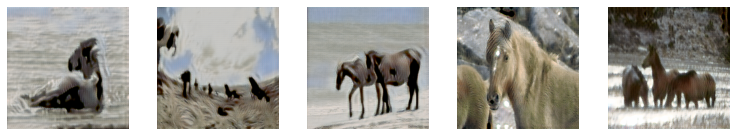

----------------------------------------------------------------------------------------------------
Input Zebra Images


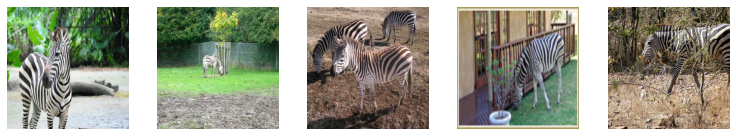

Translated (Zebra -> Horse) Images


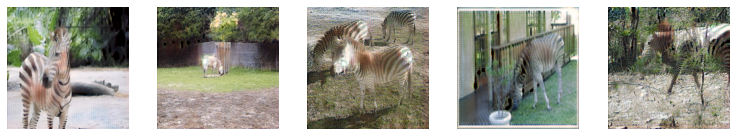

Translated reverse (Fake Horse -> Fake Zebra)


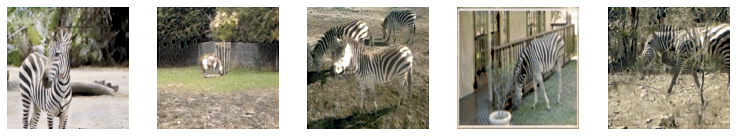

Epoch:20, Step:0, DA-Loss:0.049, DA-Acc:99.658, DB-Loss:0.021, DB-Acc:100.000, G-Loss:8.257
Epoch:20, Step:100, DA-Loss:0.248, DA-Acc:52.246, DB-Loss:0.222, DB-Acc:58.203, G-Loss:5.700
Epoch:20, Step:200, DA-Loss:0.118, DA-Acc:94.482, DB-Loss:0.027, DB-Acc:99.902, G-Loss:5.838
Epoch:20, Step:300, DA-Loss:0.009, DA-Acc:100.000, DB-Loss:0.072, DB-Acc:97.412, G-Loss:5.620
Epoch:20, Step:400, DA-Loss:0.026, DA-Acc:99.854, DB-Loss:0.093, DB-Acc:94.141, G-Loss:6.968
Epoch:20, Step:500, DA-Loss:0.205, DA-Acc:54.639, DB-Loss:0.106, DB-Acc:91.797, G-Loss:7.349
Epoch:20, Step:600, DA-Loss:0.029, DA-Acc:98.242, DB-Loss:0.026, DB-Acc:99.219, G-Loss:8.515
Epoch:20, Step:700, DA-Loss:0.012, DA-Acc:99.707, DB-Loss:0.095, DB-Acc:94.580, G-Loss:6.476
Epoch:20, Step:800, DA-Loss:0.018, DA-Acc:99.854, DB-Loss:0.015, DB-Acc:99.951, G-Loss:8.421
Epoch:20, Step:900, DA-Loss:0.030, DA-Acc:100.000, DB-Loss:0.187, DB-Acc:71.094, G-Loss:5.229
Epoch:20, Step:1000, DA-Loss:0.020, DA-Acc:100.000, DB-Loss:0.024, DB

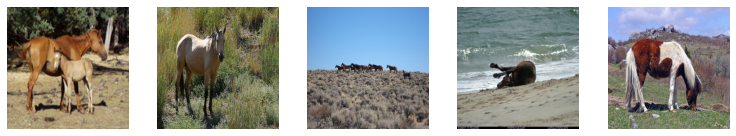

Translated (Horse -> Zebra) Images


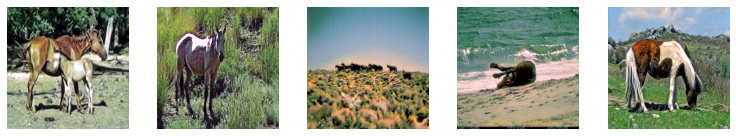

Translated reverse ( Fake Zebras -> Fake Horses)


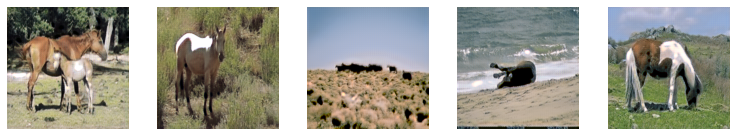

----------------------------------------------------------------------------------------------------
Input Zebra Images


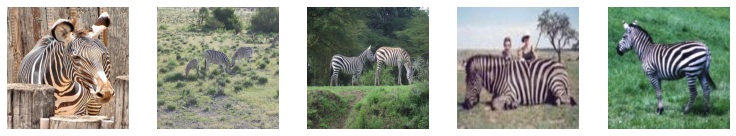

Translated (Zebra -> Horse) Images


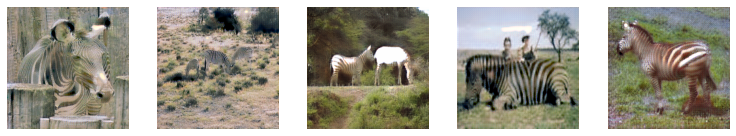

Translated reverse (Fake Horse -> Fake Zebra)


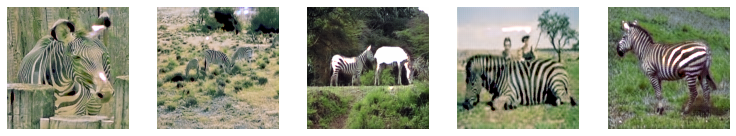

Epoch:25, Step:0, DA-Loss:0.012, DA-Acc:99.805, DB-Loss:0.146, DB-Acc:65.234, G-Loss:9.640
Epoch:25, Step:100, DA-Loss:0.012, DA-Acc:99.951, DB-Loss:0.020, DB-Acc:99.805, G-Loss:5.771
Epoch:25, Step:200, DA-Loss:0.041, DA-Acc:99.512, DB-Loss:0.034, DB-Acc:98.877, G-Loss:9.754
Epoch:25, Step:300, DA-Loss:0.097, DA-Acc:95.752, DB-Loss:0.058, DB-Acc:99.219, G-Loss:5.216
Epoch:25, Step:400, DA-Loss:0.232, DA-Acc:68.066, DB-Loss:0.019, DB-Acc:99.609, G-Loss:6.255
Epoch:25, Step:500, DA-Loss:0.013, DA-Acc:100.000, DB-Loss:0.556, DB-Acc:50.000, G-Loss:4.578
Epoch:25, Step:600, DA-Loss:0.186, DA-Acc:54.639, DB-Loss:0.077, DB-Acc:96.680, G-Loss:6.319
Epoch:25, Step:700, DA-Loss:0.044, DA-Acc:99.023, DB-Loss:0.028, DB-Acc:99.902, G-Loss:7.171
Epoch:25, Step:800, DA-Loss:0.006, DA-Acc:99.951, DB-Loss:0.013, DB-Acc:99.854, G-Loss:6.313
Epoch:25, Step:900, DA-Loss:0.031, DA-Acc:99.805, DB-Loss:0.095, DB-Acc:95.947, G-Loss:8.576
Epoch:25, Step:1000, DA-Loss:0.118, DA-Acc:89.600, DB-Loss:0.343, DB-Ac

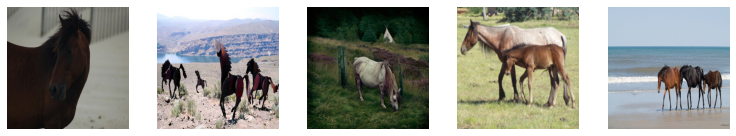

Translated (Horse -> Zebra) Images


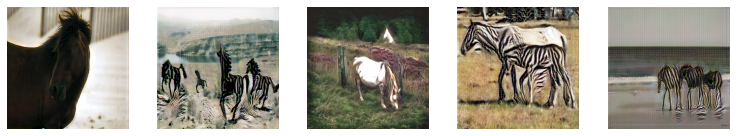

Translated reverse ( Fake Zebras -> Fake Horses)


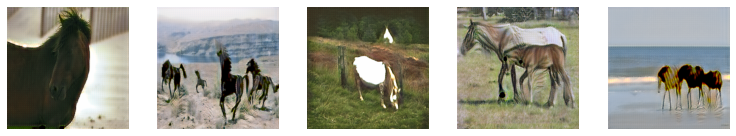

----------------------------------------------------------------------------------------------------
Input Zebra Images


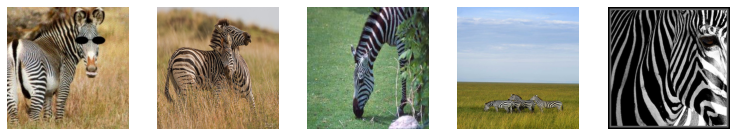

Translated (Zebra -> Horse) Images


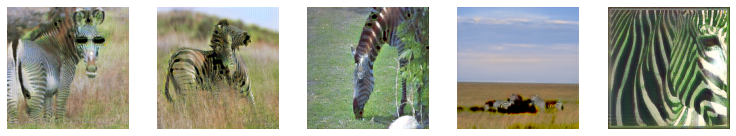

Translated reverse (Fake Horse -> Fake Zebra)


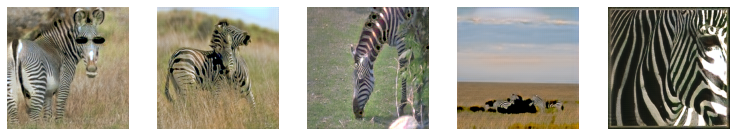

Epoch:30, Step:0, DA-Loss:0.173, DA-Acc:56.543, DB-Loss:0.037, DB-Acc:99.365, G-Loss:5.503
Epoch:30, Step:100, DA-Loss:0.305, DA-Acc:47.949, DB-Loss:0.022, DB-Acc:100.000, G-Loss:7.021
Epoch:30, Step:200, DA-Loss:0.092, DA-Acc:99.023, DB-Loss:0.016, DB-Acc:100.000, G-Loss:4.395
Epoch:30, Step:300, DA-Loss:0.457, DA-Acc:46.484, DB-Loss:0.024, DB-Acc:99.951, G-Loss:5.061
Epoch:30, Step:400, DA-Loss:0.007, DA-Acc:100.000, DB-Loss:0.018, DB-Acc:99.658, G-Loss:5.704
Epoch:30, Step:500, DA-Loss:0.067, DA-Acc:96.045, DB-Loss:0.053, DB-Acc:98.730, G-Loss:7.452
Epoch:30, Step:600, DA-Loss:0.016, DA-Acc:99.658, DB-Loss:0.176, DB-Acc:86.816, G-Loss:5.197
Epoch:30, Step:700, DA-Loss:0.018, DA-Acc:100.000, DB-Loss:0.115, DB-Acc:92.139, G-Loss:8.334
Epoch:30, Step:800, DA-Loss:0.009, DA-Acc:100.000, DB-Loss:0.009, DB-Acc:100.000, G-Loss:5.831


KeyboardInterrupt: ignored

In [ ]:
epochs = 500
batch_size = 1
steps = 1067

for i in range(0, epochs):
    if i%5 == 0:
        show_generator_results_horses_to_zebras(generator_network_AB, generator_network_BA)
        print ("-"*100)
        show_generator_results_zebras_to_horses(generator_network_AB, generator_network_BA)
    for j in range(steps):  
        # A == Horses
        # B == Zebras
        domain_A_images = get_horse_samples(batch_size)
        domain_B_images = get_zebra_samples(batch_size)

        fake_patch = np.zeros((batch_size, 32, 32, 1))
        real_patch = np.ones((batch_size, 32, 32, 1))
        
        fake_B_images = generator_network_AB(domain_A_images)
        fake_A_images = generator_network_BA(domain_B_images)
        
        # Updating Discriminator A weights
        discriminator_network_A.trainable=True
        discriminator_network_B.trainable=False
        loss_d_real_A = discriminator_network_A.train_on_batch(domain_A_images, real_patch)
        loss_d_fake_A = discriminator_network_A.train_on_batch(fake_A_images, fake_patch)
        
        loss_d_A = np.add(loss_d_real_A, loss_d_fake_A)/2.0
        
        # Updating Discriminator B weights
        discriminator_network_B.trainable=True
        discriminator_network_A.trainable=False
        loss_d_real_B = discriminator_network_B.train_on_batch(domain_B_images, real_patch)
        loss_d_fake_B = discriminator_network_B.train_on_batch(fake_B_images, fake_patch)
        
        loss_d_B = np.add(loss_d_real_B, loss_d_fake_B)/2.0
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        
        discriminator_network_A.trainable=False
        discriminator_network_B.trainable=False
        
        # Updating Generator weights
        loss_g = cycle_gan.train_on_batch([domain_A_images, domain_B_images],\
                    [real_patch, real_patch, domain_A_images, domain_B_images, domain_A_images, domain_B_images])
        
        if j%100 == 0:
            print ("Epoch:%.0f, Step:%.0f, DA-Loss:%.3f, DA-Acc:%.3f, DB-Loss:%.3f, DB-Acc:%.3f, G-Loss:%.3f"\
                   %(i,j,loss_d_A[0],loss_d_A[1]*100,loss_d_B[0],loss_d_B[1]*100,loss_g[0]))
            